In [1]:
import osmnx as ox, networkx as nx, matplotlib.cm as cm, pandas as pd, numpy as np
import geopandas as gpd
from shapely.geometry import Point, mapping
%matplotlib inline

import warnings
warnings.simplefilter(action="ignore")

pd.set_option('precision', 5)
pd.options.display.float_format = '{:20.2f}'.format
pd.set_option('display.float_format', lambda x: '%.3f' % x)
pd.options.mode.chained_assignment = None

import urbanFormPy as up

In [2]:
city_name = 'Paris'
epsg = 27571
crs = {'init': 'epsg:27571', 'no_defs': True}

### Download from OSM

Choose between the following methods:
* *OSMplace*, provide an OSM place name (e.g. City).
* *OSMpolygon*, provide an OSM polygon (relation) name.
* *distance_from_address*, provide a precise address and define parameter "distance" (which is otherwise not necessary)

In [25]:
place = 'Metropole du Grand Paris'
download_method = 'OSMpolygon'
distance = None

nodes_graph, edges_graph = up.get_network_fromOSM(place, download_method, 'drive', epsg, distance = distance)
nodes_graph, edges_graph = up.clean_network(nodes_graph, edges_graph, dead_ends = True, remove_disconnected_islands = True,
                            self_loops = True, same_uv_edges = True)

# saving
saving_path = 'C:/Users/g_filo01/sciebo/Scripts/Image of the City/Outputs/'+city_name+'/entireNetwork/'
nodes_graph.to_file(saving_path+city_name+"_nodes.shp", driver='ESRI Shapefile')
edges_graph.to_file(saving_path+city_name+"_edges.shp", driver='ESRI Shapefile')

### Load from local path

In [3]:
loading_path = 'C:/Users/g_filo01/sciebo/Scripts/Image of the City/Outputs/'+city_name+'/entireNetwork/'
nodes_graph = gpd.read_file(loading_path+city_name+'_nodes.shp')
edges_graph = gpd.read_file(loading_path+city_name+'_edges.shp')

try:
    nodes_graph, edges_graph = nodes_graph.to_crs(epsg=epsg), edges_graph.to_crs(epsg=epsg)
except:
    nodes_graph.crs, edges_graph.crs = crs, crs

nodes_graph.index, edges_graph.index  = nodes_graph.nodeID, edges_graph.edgeID
nodes_graph.index.name, edges_graph.index.name  = None, None

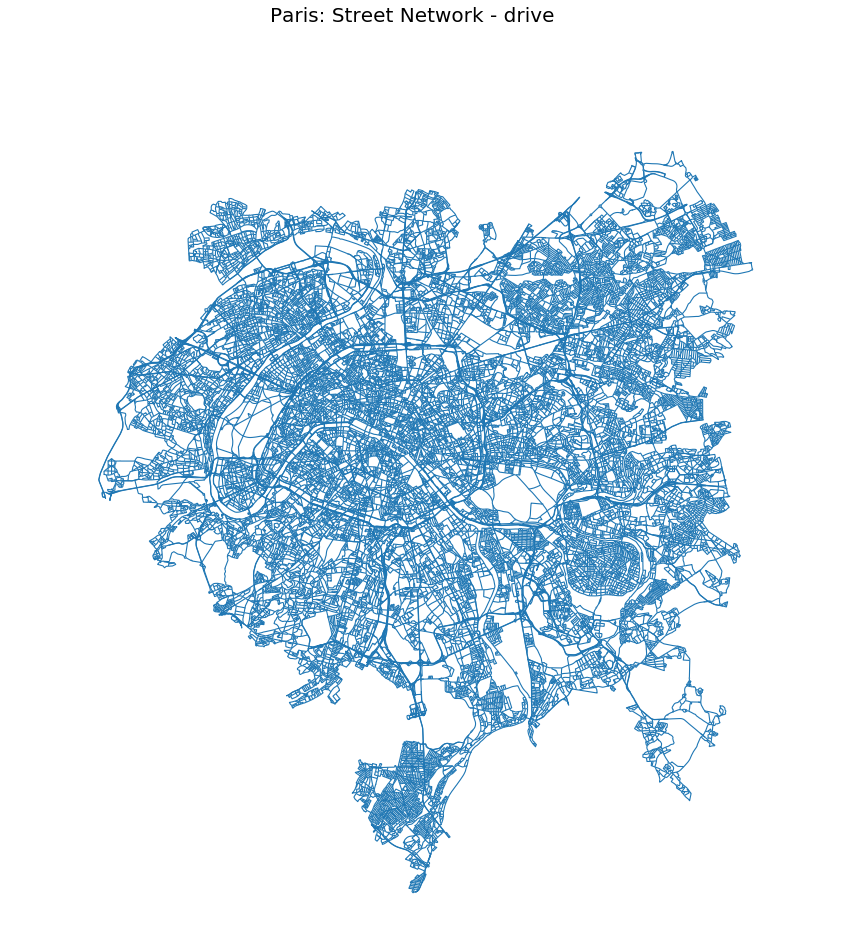

In [15]:
up.plot_lines(edges_graph, scheme = None, black_background = False, fig_size = 15, title = city_name+': Street Network - drive')

### Download or upload barriers

Choose between the following methods:
* *OSMplace*, provide an OSM place name (e.g. City).
* *distance_from_address*, provide a precise address and define parameter "distance" (which is otherwise not necessary)
* *polygon*, provide a Polygon (coordinates must be in units of latitude-longitude degrees).

In [4]:
# download barrier and save
place = up.envelope_wgs(edges_graph)
download_method = "polygon"
distance = None
barriers = up.get_barriers(place, download_method, distance, epsg)
saving_path = 'C:/Users/g_filo01/sciebo/Scripts/Image of the City/Outputs/'+city_name+'/entireNetwork/'
barriers.to_file(saving_path+city_name+"_barriers.shp", driver='ESRI Shapefile')

In [5]:
## loading barriers
loading_path = 'C:/Users/g_filo01/sciebo/Scripts/Image of the City/Outputs/'+city_name+'/entireNetwork/'
barriers = gpd.read_file(loading_path+city_name+"_barriers.shp", driver='ESRI Shapefile')

### Visualisation

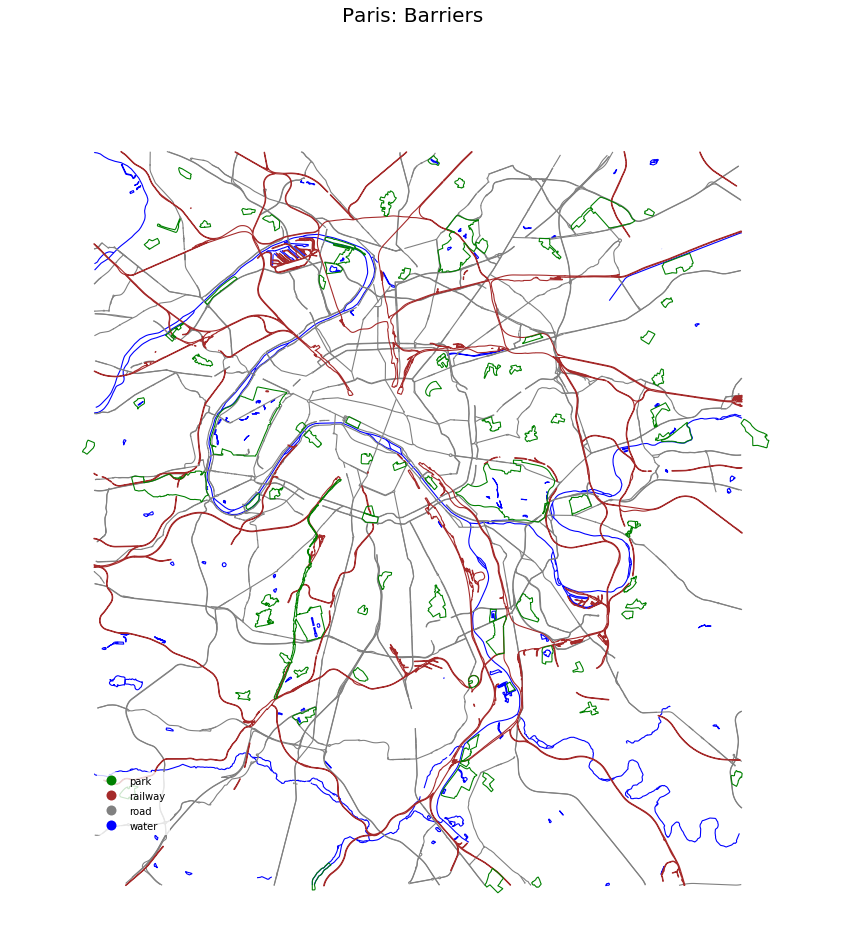

In [8]:
up.plot_barriers(barriers, black_background = False, fig_size = 15, title = city_name+': Barriers', legend = True)

## District identification full network

In [26]:
# Creating the dual geodataframes and the dual graph.
nodesDual_graph, edgesDual_graph = up.dual_gdf(nodes_graph, edges_graph, epsg)

saving_path = 'C:/Users/g_filo01/sciebo/Scripts/Image of the City/Outputs/'+city_name+'/entireNetwork/'
nodesDual_graph.drop('intersecting', axis = 1).to_file(saving_path+city_name+"_nodesDual.shp", driver='ESRI Shapefile')
edgesDual_graph.to_file(saving_path+city_name+"_edgesDual.shp", driver='ESRI Shapefile')

In [9]:
# or loading
loading_path = 'C:/Users/g_filo01/sciebo/Scripts/Image of the City/Outputs/'+city_name+'/entireNetwork/'
nodesDual_graph = gpd.read_file(loading_path+city_name+'_nodesDual.shp')
edgesDual_graph = gpd.read_file(loading_path+city_name+'_edgesDual.shp')

try:
    nodesDual_graph, edgesDual_graph = nodesDual_graph.to_crs(epsg=epsg), edgesDual_graph.to_crs(epsg=epsg)
except:
    nodesDual_graph.crs, edgesDual_graph.crs = crs, crs

nodesDual_graph.index = nodesDual_graph.edgeID
nodesDual_graph.index.name = None

In [10]:
# creating dual_graph
dual_graph = up.dual_graph_fromGDF(nodesDual_graph, edgesDual_graph)

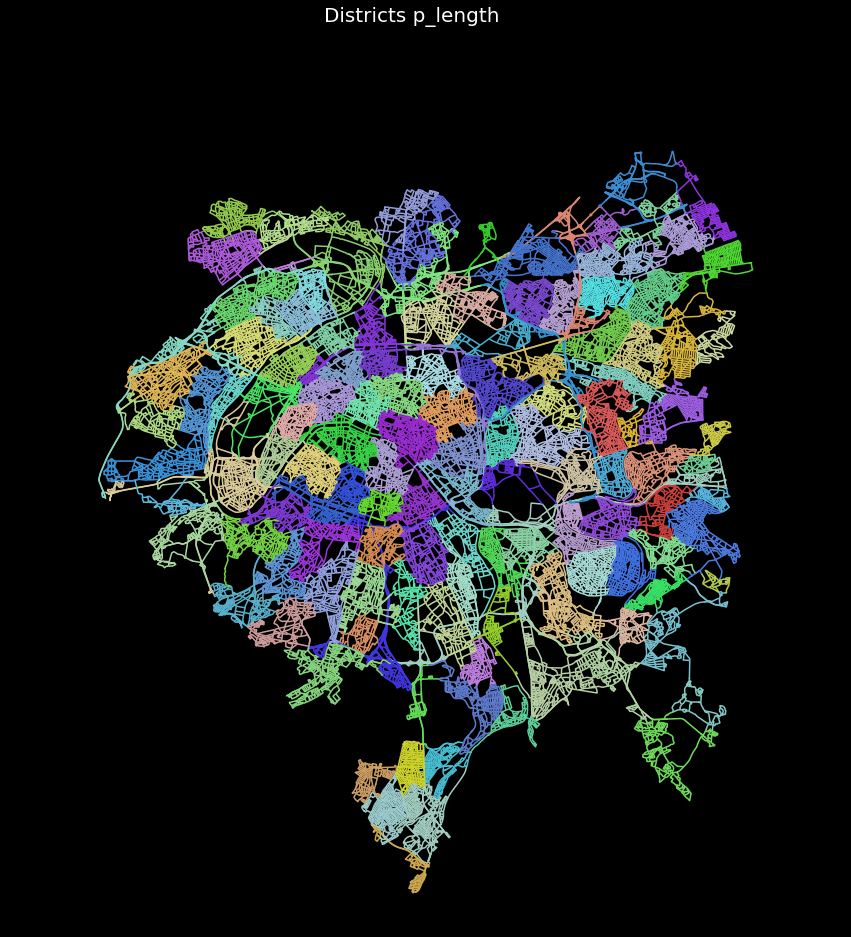

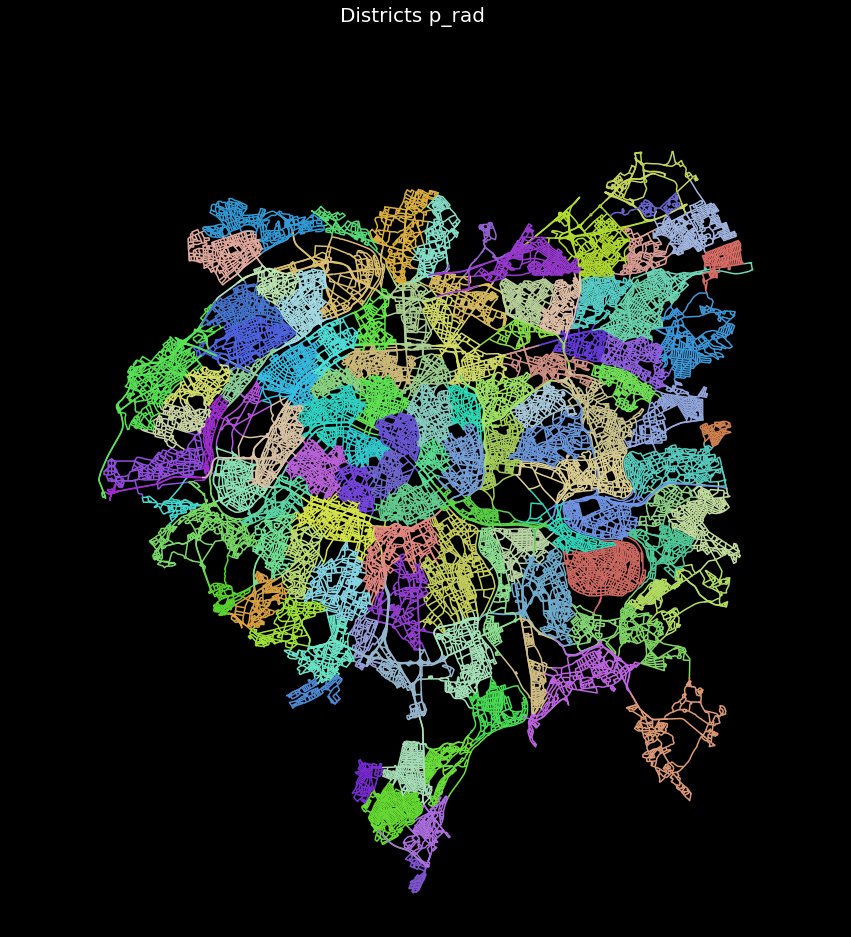

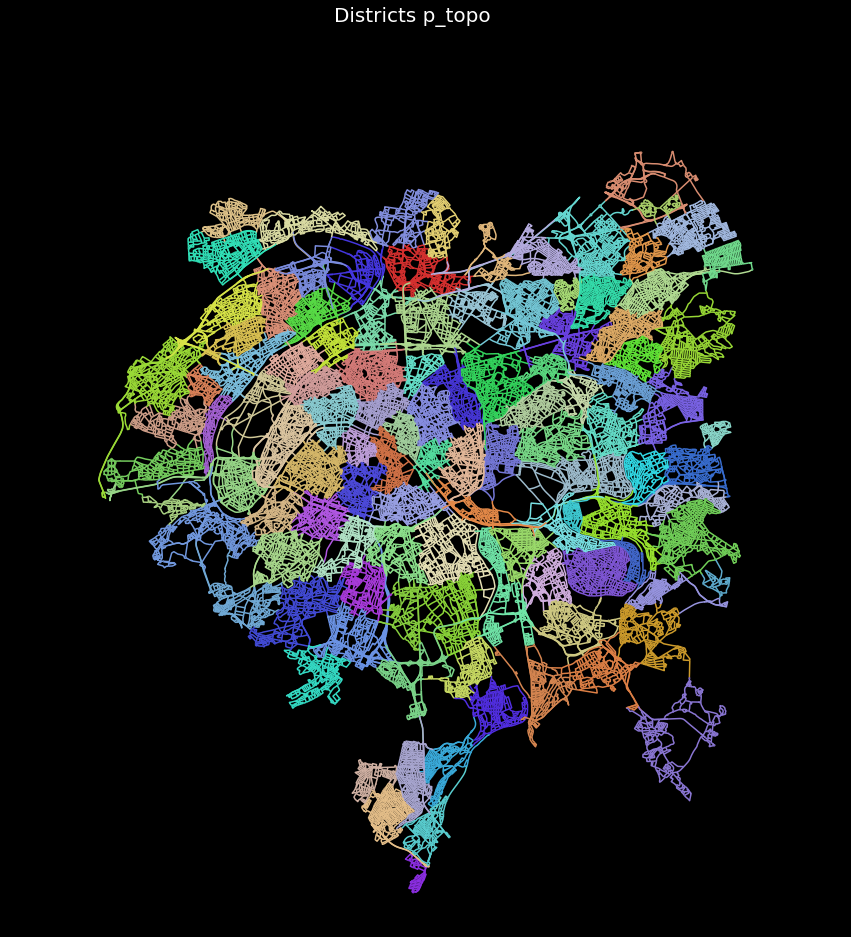

In [12]:
"""
Different weights are used to extract the partitions. "None" indicates that no weights will be used 
(only topological relationships will matter). The function returns a GeoDataFrame with partitions assigned to edges,
with column named as "p_name_weight" (e.g. "p_length")
 
"""
# weights = ['length', 'rad', None]
# districts = edges_graph.copy()
# for i in weights:
#     districts = up.identify_regions(dual_graph, districts, weight = i)
    
# visualising
columns = ['p_length','p_rad', 'p_topo']
for column in columns:
    cmap = up.rand_cmap(nlabels = len(districts[column].unique()), type_color='bright', first_color_black=False, 
                     last_color_black=False)
    up.plot_lines(districts, column = column, title = 'Districts '+column, lw = 1.5, cmap = cmap, black_background = True, 
                      legend = False, fig_size = 15)

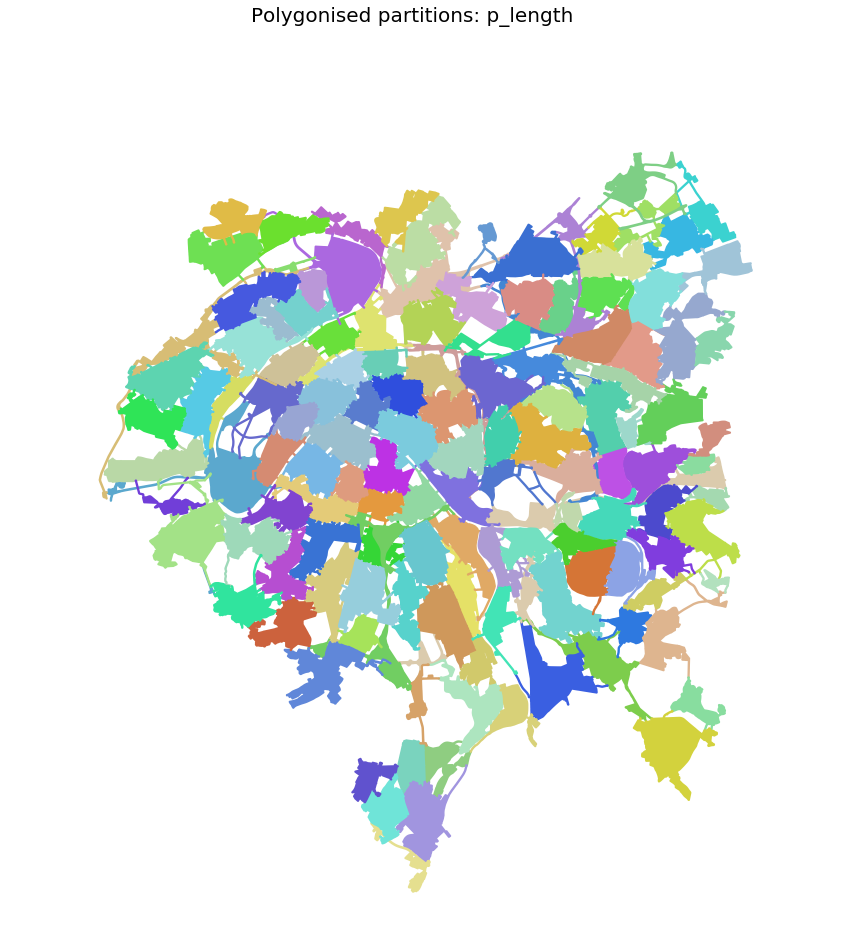

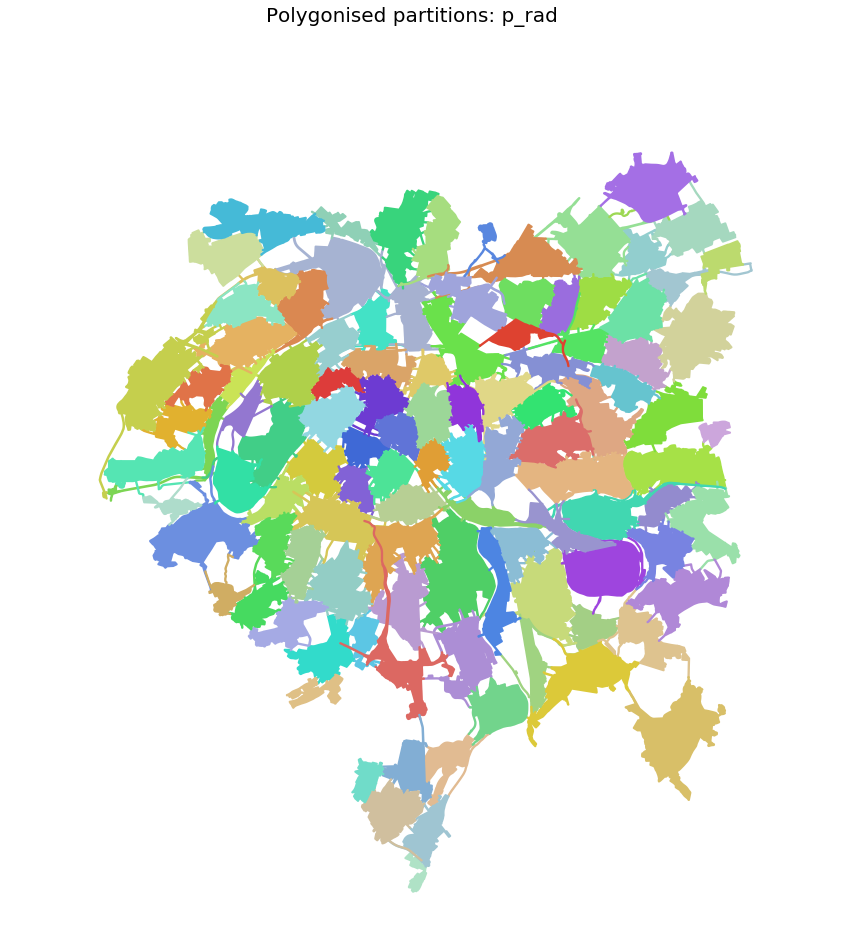

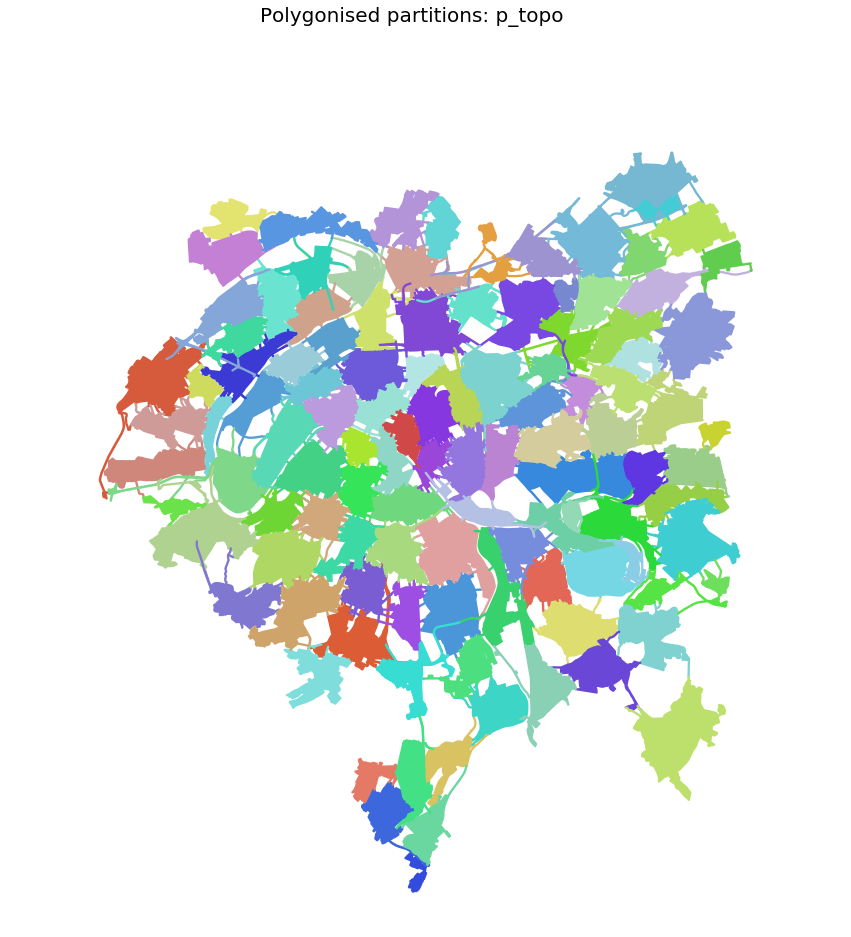

In [14]:
for column in columns:
    cmap = up.rand_cmap(nlabels = len(districts[column].unique()), type_color='bright', first_color_black=False, 
                     last_color_black=False)
    partitions = up.polygonise_partition(districts, column, crs)
    up.plot_polygons(partitions, column = 'partitionID', cmap = cmap, title =  "Polygonised partitions: "+ column, 
                     black_background = False,  fig_size = 15)

In [16]:
# saving
saving_path = 'C:/Users/g_filo01/sciebo/Scripts/Image of the City/Outputs/'+city_name+'/entireNetwork/'
districts.to_file(saving_path+city_name+"_edges.shp", driver='ESRI Shapefile')

## District identification with network broken by negative barriers

In [81]:
# crossing any kind of barrier but parks
envelope = edges_graph_ped.unary_union.envelope.buffer(100)
barriers_within = barriers[barriers.intersects(envelope)]
# along rivers 
edges_graph = up.along_rivers(edges_graph, barriers_within)

tmp = barriers_within[barriers_within['type'] != 'park'].copy()
edges_graph['c_barr'] = edges_graph.apply(lambda row: up.crossing_barriers(row['geometry'], tmp ), axis = 1)
edges_graph['r_bool'] = edges_graph.apply(lambda row: True if len(row['a_rivers']) > 0 else False, axis = 1)
edges_graph['sep_barr'] = edges_graph.apply(lambda row: True if ((len(row['c_barr']) > 0) & (row['r_bool'] == False))  
                                                                 else False, axis = 1)

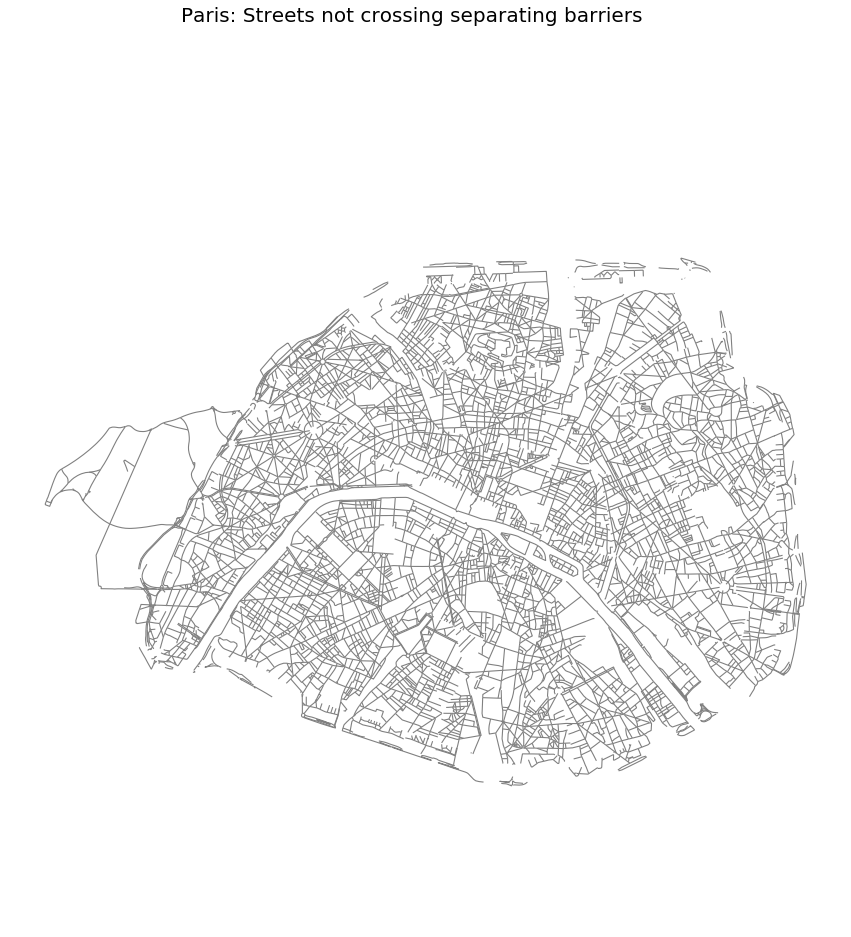

In [82]:
# ## removing streets segments which are crossing barriers
edges_graph_nb = edges_graph[edges_graph.sep_barr != True].copy()
nodes_graph_nb, edges_graph_nb = up.clean_network(nodes_graph, edges_graph_nb, dead_ends = False, 
                        remove_disconnected_islands = False, self_loops = True, same_uv_edges = True)
up.plot_lines(edges_graph_nb, black_background = False, fig_size = 15,  color = 'gray', 
              title = city_name+': Streets not crossing separating barriers', legend = False)

In [83]:
# dualGraph
nodesDual_graph_nb, edgesDual_graph_nb = up.dual_gdf(nodes_graph_nb, edges_graph_nb, epsg)
dual_graph_nb = up.dual_graph_fromGDF(nodesDual_graph_nb.drop(['a_rivers', 'c_barr'], axis = 1), edgesDual_graph_nb)

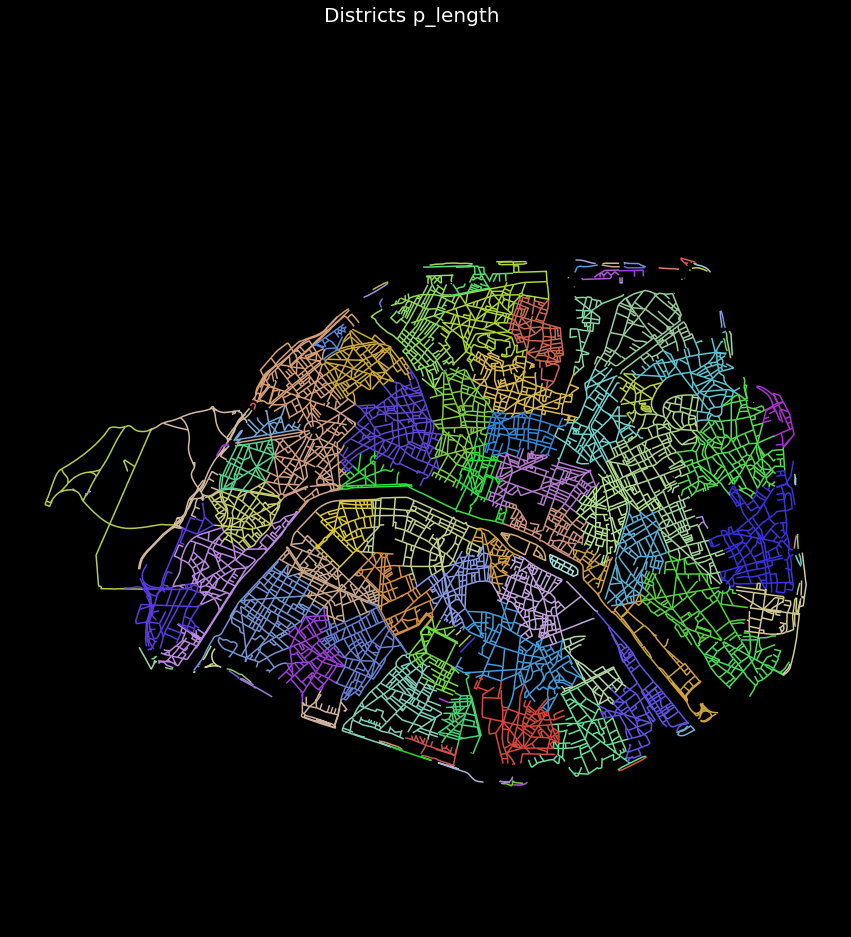

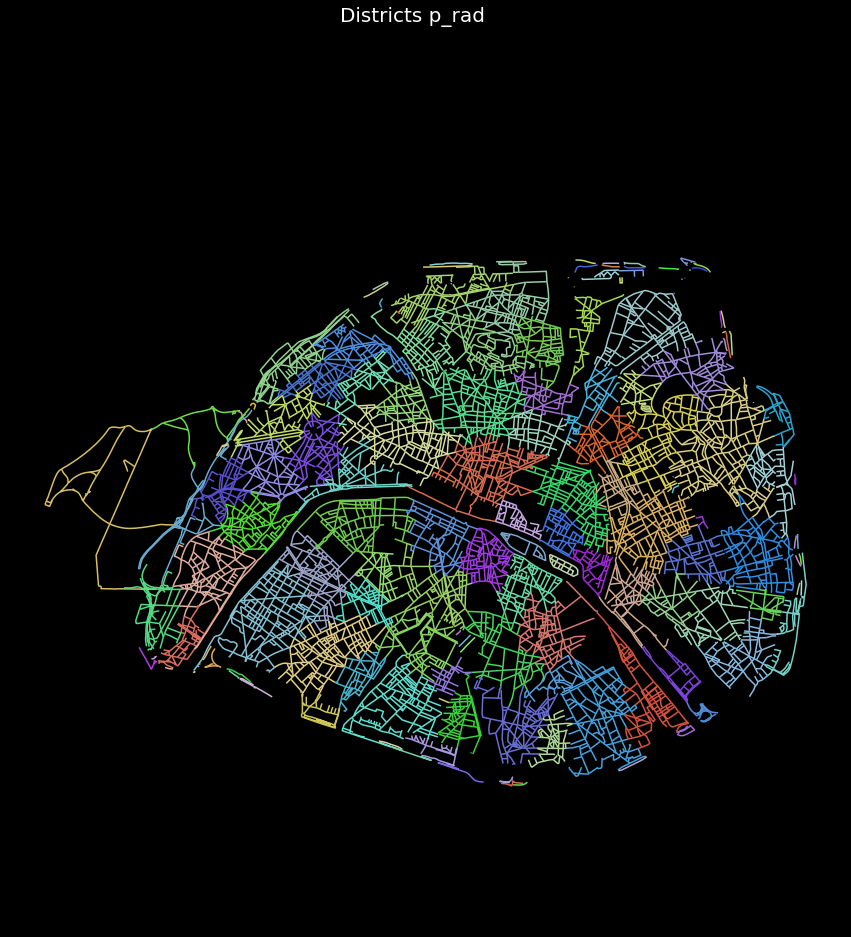

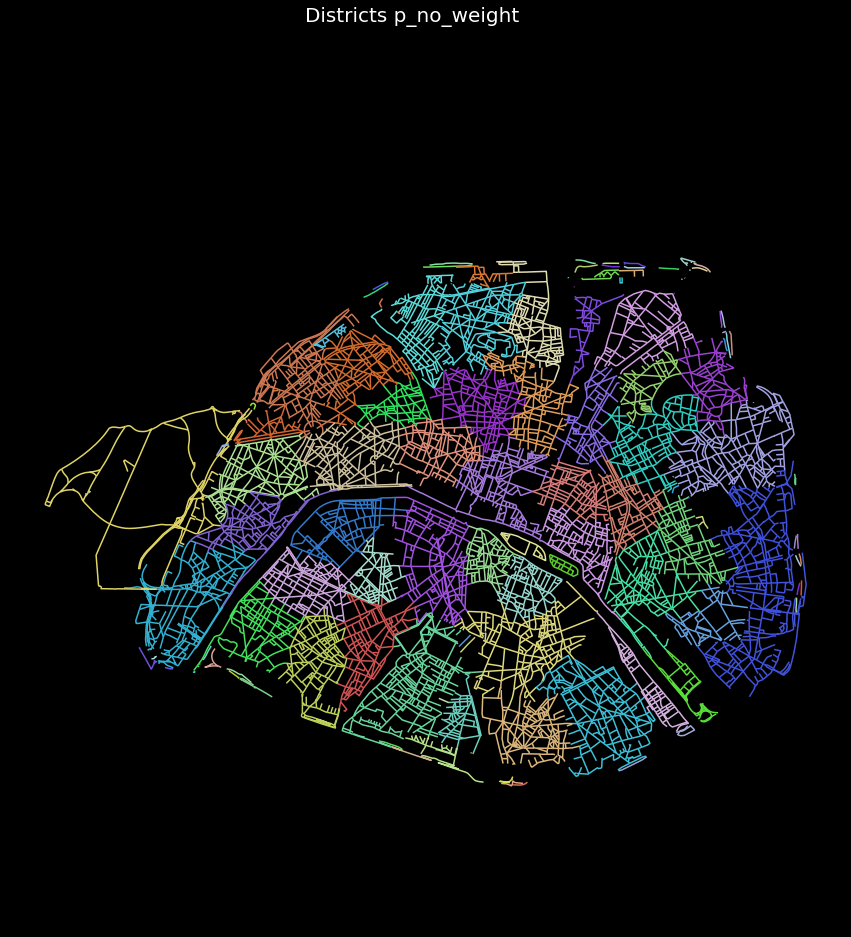

In [87]:
"""
Different weights are used to extract the partitions. "None" indicates that no weights will be used 
(only topological relationships will matter). The function returns a GeoDataFrame with partitions assigned to edges,
with column named as "p_name_weight" (e.g. "p_length")
 
"""
weights = ['length', 'rad', None]
districts_nb = edges_graph_nb.copy()
for i in weights:
    districts_nb = up.identify_regions(dual_graph_nb, districts_nb, weight = i)
    
# visualising
columns = ['p_length','p_rad', 'p_no_weight']
for column in columns:
    cmap = up.rand_cmap(nlabels = len(districts_nb[column].unique()), type_color='bright', first_color_black=False, 
                     last_color_black=False)
    up.plot_lines(districts_nb, column = column, title = 'Districts '+column, lw = 1.5, cmap = cmap, 
                  black_background = True, legend = False, fig_size = 15)

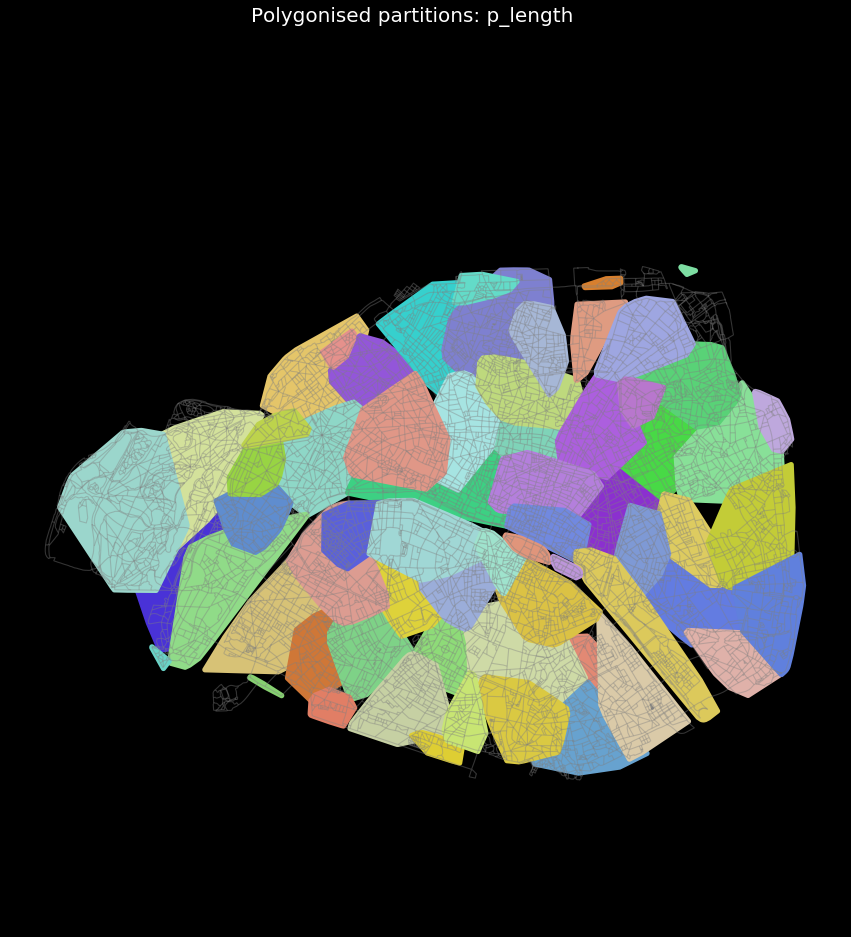

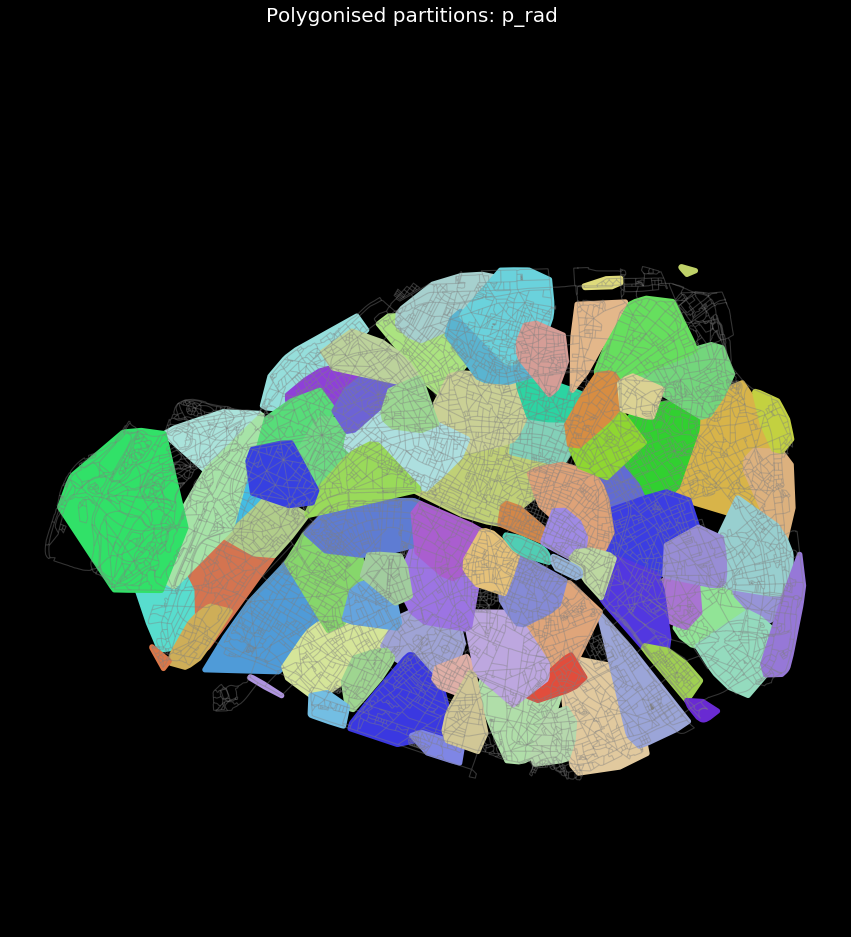

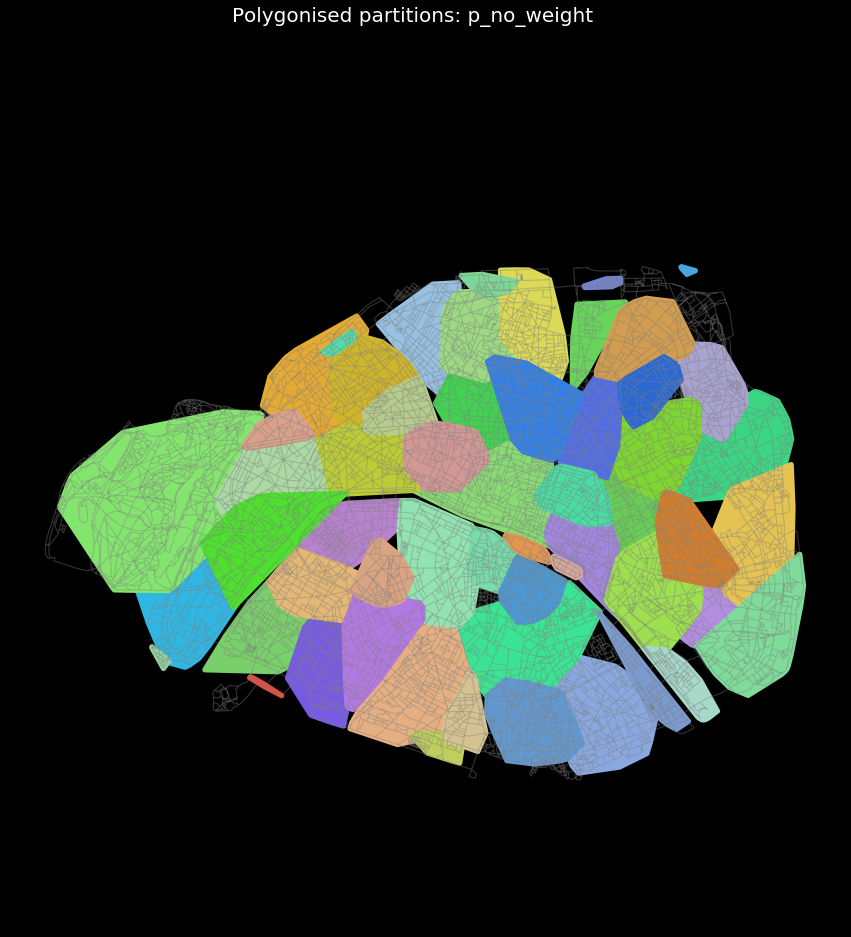

In [154]:
for column in columns:
    cmap = up.rand_cmap(nlabels = len(districts_nb[column].unique()), type_color='bright', first_color_black=False, 
                     last_color_black=False)
    dc = dict(districts_nb[column].value_counts())
    to_ignore = {k: v for k, v in dc.items() if v <= 3}
    tmp = districts_nb[~districts_nb[column].isin(to_ignore)].copy()
    partitions = up.polygonise_partition(tmp, column, crs)
    up.plot_polygons(partitions, column = 'partitionID', cmap = cmap, title =  "Polygonised partitions: "+ column, 
                     black_background = True,  fig_size = 15, gdf_base_map = edges_graph_ped, base_map_color = 'grey')

In [98]:
edges_graph = pd.merge(edges_graph, districts_nb[['p_rad', 'edgeID']], how = 'left', left_on= "edgeID", right_on = "edgeID")
edges_graph['p_rad'] = edges_graph['p_rad'].where(~edges_graph['p_rad'].isnull(), 999999)
edges_graph['p_rad'] = edges_graph['p_rad'].astype(int)
edges_graph.index = edges_graph.edgeID
edges_graph.index.name = None

In [100]:
to_convert = ['a_rivers', 'c_barr']
edges_graph_string = edges_graph.copy()
for column in to_convert: edges_graph_string[column] = edges_graph_string[column].astype(str)
saving_path = 'C:/Users/g_filo01/sciebo/Scripts/Image of the City/Outputs/'+city_name+'/drive/'
edges_graph_string.to_file(saving_path+city_name+"_edges.shp", driver='ESRI Shapefile')
edges_graph = edges_graph_string.copy()